## PBMC atlas

https://www.nature.com/articles/s41587-023-01881-x#data-availability

In [1]:
import time
from pathlib import Path
proj_name = "pbmc_atac_dev"
save_dir = f"../save/dev_{proj_name}-{time.strftime('%b%d')}/"
save_dir = Path(save_dir)
save_dir.mkdir(parents=True, exist_ok=True)

data_dir = f"../data/human_pbmc_atac_benchmark/"
data_dir = Path(data_dir)

file_suffix = f"{time.strftime('%b%d-%H%M')}"
file_suffix

'Jun19-1239'

In [62]:
# This script is used to load the loom file and extract the embedding information, whicb needs to be deleted to load the loom file into scanpy.
import h5py
import numpy as np

loom_path = "../data/human_pbmc_atac_benchmark/master_all_1.FIXEDCELLS__count_matrix_in_own_peaks.loom"

with h5py.File(loom_path, "r") as f:
    # Check what's in /col_attrs
    print(list(f["/col_attrs"].keys()))

    # Access the Embedding compound field
    embedding = f["/col_attrs/Embedding"][:]

    # Extract the individual fields
    embedding_x = embedding["_X"]
    embedding_y = embedding["_Y"]

    print(embedding_x[:5], embedding_y[:5])

# Save the original embedding to a file
original_embedding = np.vstack([embedding_x, embedding_y]).T
np.savetxt("../data/human_pbmc_atac_benchmark/original_embedding_fixedcells.txt", original_embedding, delimiter="\t", header="X\tY", comments="")

loom_path = "../data/human_pbmc_atac_benchmark/master_all_1.FIXEDCELLS__count_matrix_in_own_peaks.loom"

with h5py.File(loom_path, "r+") as f:
    # List all column attributes
    print(list(f["/col_attrs"].keys()))

    # Delete the offending field
    del f["/col_attrs/Embedding"]


import scanpy as sc
adata = sc.read_loom(loom_path)
adata.obs['dataset'] = adata.obs_names.str.split('___').str[-1]
adata.obsm['tSNE_publication'] = original_embedding
adata.write_h5ad("../data/human_pbmc_atac_benchmark/fixedcells_consensus.h5ad")


['CellID', 'Dupl_rate', 'FRIP', 'Scrublet_doublet_score', 'TSS_enrichment', 'Unique_nr_frag_in_regions', 'harmony_consensus_cell_type__mega', 'harmony_pycisTopic_leiden_10_3.0', 'seurat_cell_type_pred_score__mega']


KeyError: "Unable to synchronously open object (object 'Embedding' doesn't exist)"

After preprocessing, future run can start from prepared adata.

In [2]:
import scanpy as sc
#adata = sc.read_h5ad("../data/human_pbmc_atac_benchmark/fixedcells_consensus.h5ad")
adata = sc.read_h5ad("../data/human_pbmc_atac_benchmark/adata_fixedcells_consensus_processed_Jun07-1959.h5ad")

In [4]:
import numpy as np
adata.layers['counts'] = adata.X.copy()  # Store the original counts in a layer
adata.obs['n_transcripts'] = adata.layers['counts'].sum(axis=1).A1
adata.obs['n_transcripts_log1p'] = np.log1p(adata.obs['n_transcripts'])
adata.obs['n_features'] = (adata.layers['counts'] > 0).sum(axis=1).A1

In [7]:
# Load genotype txt file
import pandas as pd
genotype_res = pd.read_csv("../data/human_pbmc_atac_benchmark/genotype_concordance_unified.fixedcells_2_cistopic.txt", sep="\t")
# extract the technology, remove anything after 'FIXEDCELLS'
genotype_res['technology'] = genotype_res.index.str.replace(r'FIXEDCELLS.*', 'FIXEDCELLS', regex=True)
genotype_res['cell_name'] = genotype_res['BARCODE'] + "___" + genotype_res['technology']
# Check overlap between adata and genotype_res
overlap = adata.obs_names.intersection(genotype_res['cell_name'])
print(f"Number of overlapping cells: {len(overlap)}")

Number of overlapping cells: 107176


In [ ]:
# Assign called sample to adata.obs
adata.obs['called_sample'] = np.nan
adata.obs.loc[overlap, 'called_sample'] = genotype_res.set_index('cell_name').loc[overlap, 'sample'].values
adata.obs['called_sample'].value_counts()

/var/folders/wl/5x49grmn56v77c01bw965mj00000gn/T/ipykernel_7409/568592728.py:3: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '['sampleB' 'sampleB' 'sampleB' ... 'sampleA' 'sampleA' 'sampleA']' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  adata.obs.loc[overlap, 'called_sample'] = genotype_res.set_index('cell_name').loc[overlap, 'sample'].values


In [11]:
adata.obs['dataset'].value_counts()

dataset
TXG_10xv2_2.FIXEDCELLS          9640
TXG_10xv11_1.FIXEDCELLS         9617
TXG_10xv2_1.FIXEDCELLS          9587
VIB_10xv1_2.FIXEDCELLS          7589
MDC_mtscatac_1.FIXEDCELLS       7236
BIO_ddseq_1.FIXEDCELLS          6148
MDC_mtscatac_2.FIXEDCELLS       5531
CNA_10xv2_2.FIXEDCELLS          5410
UCS_ddseq_1.FIXEDCELLS          5155
BIO_ddseq_2.FIXEDCELLS          5055
HAR_ddseq_2.FIXEDCELLS          4857
UCS_ddseq_2.FIXEDCELLS          4488
HAR_ddseq_1.FIXEDCELLS          4402
CNA_10xv11_3.FIXEDCELLS         4354
SAN_10xmultiome_2.FIXEDCELLS    3826
CNA_10xv2_1.FIXEDCELLS          3740
BRO_mtscatac_1.FIXEDCELLS       3413
CNA_10xmultiome_1.FIXEDCELLS    3224
BRO_mtscatac_2.FIXEDCELLS       3223
SAN_10xmultiome_1.FIXEDCELLS    3133
OHS_s3atac_1.FIXEDCELLS         3067
VIB_10xv2_2.FIXEDCELLS          3054
EPF_hydrop_1.FIXEDCELLS         2973
VIB_10xv2_1.FIXEDCELLS          2966
VIB_hydrop_2.FIXEDCELLS         2883
EPF_hydrop_2.FIXEDCELLS         2804
VIB_10xv1_1.FIXEDCELLS        

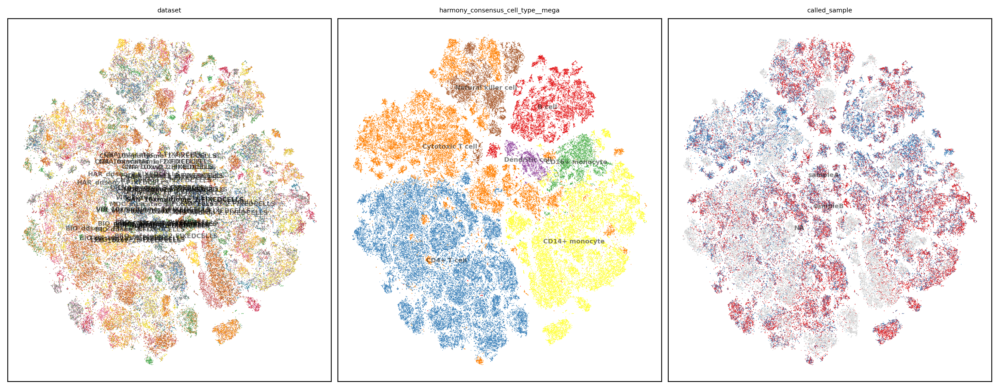

In [77]:
import concord as ccd
show_basis = f'tSNE_publication'
show_cols = ['dataset', 'harmony_consensus_cell_type__mega', 'called_sample']   
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(13,5), dpi=300, ncols=3,  font_size=6, point_size=1, legend_loc='on data',
    save_path=save_dir / f"original_embeddings_{show_basis}_{file_suffix}.png"
)

In [58]:
sc.pp.normalize_total(adata, target_sum=1e4)
# log transform
sc.pp.log1p(adata)

In [59]:
# FInd highly variable genes
sc.pp.highly_variable_genes(adata, n_top_genes=10000, flavor='seurat_v3', subset=False)
# PCA and UMAP
n_latent = 50
sc.pp.pca(adata, n_comps=n_latent, svd_solver='arpack', use_highly_variable=True)
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=n_latent)
sc.tl.umap(adata, min_dist=0.1, n_components=2)

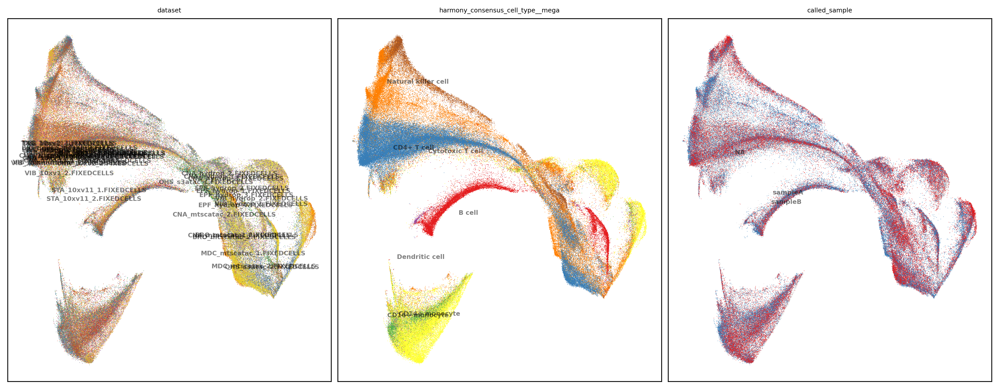

In [78]:
import concord as ccd

show_basis = f'X_umap'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(13,5), dpi=300, ncols=3,  font_size=6, point_size=1, legend_loc='on data',
    save_path=save_dir / f"embeddings_{show_basis}_{file_suffix}.png"
)

### CONCORD

In [64]:
import concord as ccd
hvg_list = adata.var_names[adata.var['highly_variable']].tolist()
cur_ccd = ccd.Concord(adata=adata, 
                      latent_dim = n_latent,
                      input_feature = hvg_list,
                      domain_key='dataset', # key in adata.obs that contains domain labels
                      save_dir=save_dir, # directory to save model checkpoints
                      inplace=False, # whether to modify adata in place
                      ) 

# Encode data, saving the latent embedding in adata.obsm['Concord']
output_key = 'Concord'
cur_ccd.encode_adata(input_layer_key='X', output_key=output_key, preprocess=False)
adata.obsm = cur_ccd.adata.obsm.copy()
# Save the latent embedding to a file, so that it can be loaded later
ccd.ul.save_obsm_to_hdf5(cur_ccd.adata, save_dir / f"adata_obsm_{file_suffix}.h5")

FAISS not found. Using sklearn for k-NN computation.


p_intra_knn: 0.3


Epoch 0 Training: 2622it [00:40, 64.29it/s, loss=3.54]
Epoch 9 Training: 100%|██████████| 2622/2622 [00:39<00:00, 66.93it/s, loss=3.28]


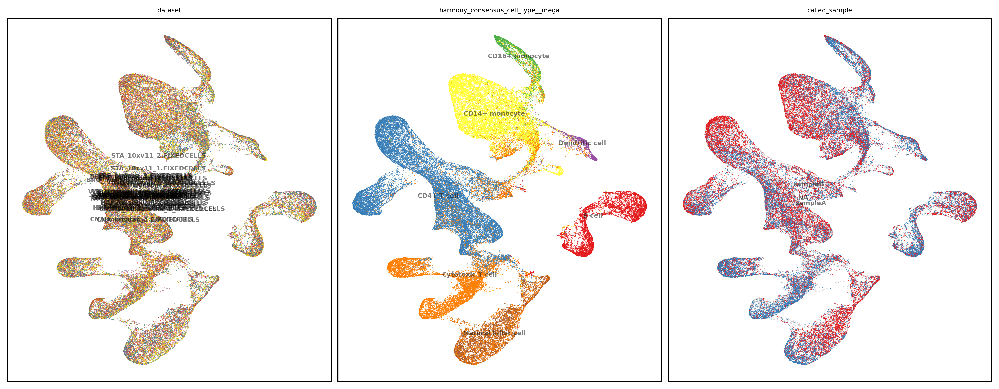

In [80]:

#ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=15, min_dist=0.1, metric='euclidean')
output_key = 'Concord'
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(13,5), dpi=300, ncols=3,  font_size=6, point_size=1, legend_loc='on data',
    save_path=save_dir / f"embeddings_{show_basis}_{file_suffix}.png"
)

In [81]:
# save adata
adata.write_h5ad(data_dir / f"adata_fixedcells_consensus_processed_{file_suffix}.h5ad")
print(f"Saved adata to {data_dir / f'adata_fixedcells_consensus_processed_{file_suffix}.h5ad'}")
ccd.ul.anndata_to_viscello(adata, data_dir / f"cello_fixedcells_consensus_processed_{proj_name}_{file_suffix}", project_name = proj_name, organism='hsa')
print(f"Saved viscello to {data_dir / f'cello_fixedcells_consensus_processed_{proj_name}_{file_suffix}'}")


Saved adata to ../data/human_pbmc_atac_benchmark/adata_fixedcells_consensus_processed_Jun11-1522.h5ad
Concord - INFO - Normalized expression data (adata.layers['X_log1p']) not found. Renormalize and log transforming.
VisCello project created at ../data/human_pbmc_atac_benchmark/cello_fixedcells_consensus_processed_pbmc_atac_dev_Jun11-1522
Saved viscello to ../data/human_pbmc_atac_benchmark/cello_fixedcells_consensus_processed_pbmc_atac_dev_Jun11-1522


### Compute gene activity matrix

In [17]:
import pandas as pd
import numpy as np
import pybedtools
from anndata import AnnData
from scipy.sparse import csr_matrix, find
import re

# Assume 'adata' is your input scATAC AnnData object (cells x peaks)
# and adata.layers['counts'] contains the raw counts. If using adata.X, replace as needed.
# adata: AnnData object with shape (n_cells, n_peaks)

# Step 1: Create a BEDTool object from peak annotations
print("Step 1: Parsing peaks...")
peak_df = adata.var_names.to_series().str.extract(r'(chr[\w]+):(\d+)-(\d+)')
peak_df.columns = ['chrom', 'start', 'end']
peak_df['start'] = peak_df['start'].astype(int)
peak_df['end'] = peak_df['end'].astype(int)
peak_df['peak_id'] = adata.var_names
peak_bed = pybedtools.BedTool.from_dataframe(peak_df)

# Step 2: Load gene annotations and define gene activity regions
print("Step 2: Processing gene annotations...")
gtf_path = "../resources/refdata-gex-GRCh38-2024-A/genes/genes.gtf"
gtf = pd.read_csv(
    gtf_path,
    sep="\t",
    comment="#",
    header=None,
    names=["chrom", "source", "feature", "start", "end", "score", "strand", "frame", "attributes"]
)

# Filter for gene features and parse attributes
genes_df = gtf[gtf["feature"] == "gene"].copy()

def parse_attributes(attr_str):
    attrs = dict(re.findall(r'(\S+) "(.*?)"', attr_str))
    # Use gene_name as the primary identifier, falling back to gene_id if name is absent
    return attrs.get("gene_name", attrs.get("gene_id"))

genes_df["gene_name"] = genes_df["attributes"].apply(parse_attributes)
genes_df = genes_df.dropna(subset=["gene_name"])

# Define gene activity region (gene body + 2kb upstream of TSS)
def make_gene_activity_region(row, upstream=2000):
    # For '+' strand, TSS is at the start
    if row["strand"] == "+":
        promoter_start = max(0, row["start"] - upstream)
        promoter_end = row["start"]
        # The region includes the promoter and the gene body
        return pd.Series([row["chrom"], promoter_start, row["end"], row["gene_name"]])
    # For '-' strand, TSS is at the end
    else:
        promoter_start = row["end"]
        promoter_end = row["end"] + upstream
        # The region includes the gene body and the promoter
        return pd.Series([row["chrom"], row["start"], promoter_end, row["gene_name"]])

gene_regions_df = genes_df.apply(make_gene_activity_region, axis=1)
gene_regions_df.columns = ["chrom", "start", "end", "gene_name"]
gene_regions_bed = pybedtools.BedTool.from_dataframe(gene_regions_df)



Step 1: Parsing peaks...
Step 2: Processing gene annotations...


In [20]:
# Step 3: Find overlaps between peaks and gene activity regions
print("Step 3: Intersecting peaks and genes...")
# Use wa=True, wb=True to get both peak and gene info
# Corrected column names for the output DataFrame
overlap_df = peak_bed.intersect(gene_regions_bed, wa=True, wb=True).to_dataframe(
    names=['peak_chrom', 'peak_start', 'peak_end', 'peak_id',
           'gene_chrom', 'gene_start', 'gene_end', 'gene_name']
)

overlap_df

Step 3: Intersecting peaks and genes...


***** WARNING: File /var/folders/wl/5x49grmn56v77c01bw965mj00000gn/T/pybedtools.m15ua464.tmp has inconsistent naming convention for record:
GL000009.2	56140	60376	ENSG00000278704

***** WARNING: File /var/folders/wl/5x49grmn56v77c01bw965mj00000gn/T/pybedtools.m15ua464.tmp has inconsistent naming convention for record:
GL000009.2	56140	60376	ENSG00000278704



,peak_chrom,peak_start,peak_end,peak_id,gene_chrom,gene_start,gene_end,gene_name
0,chr19,44722219,44722719,chr19:44722219-44722719,chr19,44631573,44727217,CEACAM16-AS1
1,chr9,129865026,129865526,chr9:129865026-129865526,chr9,129832698,129881828,USP20
2,chr11,102317693,102318193,chr11:102317693-102318193,chr11,102316173,102330586,ENSG00000288528
3,chr11,102317693,102318193,chr11:102317693-102318193,chr11,102315484,102339403,BIRC3
4,chr13,113112853,113113353,chr13:113112853-113113353,chr13,113103788,113120685,F7
...,...,...,...,...,...,...,...,...
196552,chr22,20266642,20267142,chr22:20266642-20267142,chr22,20241415,20285246,RTN4R
196553,chr9,37034670,37035170,chr9:37034670-37035170,chr9,36833269,37036268,PAX5
196554,chr3,46929956,46930456,chr3:46929956-46930456,chr3,46921726,46984010,CCDC12
196555,chr14,68513770,68514270,chr14:68513770-68514270,chr14,67817779,68730218,RAD51B


In [21]:
# Step 4: Create a binary peak-to-gene mapping matrix (Efficient Method)
print("Step 4: Building peak-to-gene mapping matrix...")
# Create categorical types for faster mapping
overlap_df['peak_id'] = overlap_df['peak_id'].astype('category')
overlap_df['gene_name'] = overlap_df['gene_name'].astype('category')

# Get the integer indices for peaks and genes
peak_indices = overlap_df['peak_id'].cat.codes.values
gene_indices = overlap_df['gene_name'].cat.codes.values

# Get the dimensions for the mapping matrix
n_peaks = len(adata.var_names)
n_genes = len(overlap_df['gene_name'].cat.categories)

# Create the sparse mapping matrix (peaks x genes)
# A value of 1 at (i, j) means peak i maps to gene j
peak_to_gene_matrix = csr_matrix((np.ones_like(peak_indices), (peak_indices, gene_indices)),
                                 shape=(n_peaks, n_genes))
print(f"Peak-to-gene mapping matrix shape: {peak_to_gene_matrix.shape}")

Step 4: Building peak-to-gene mapping matrix...
Peak-to-gene mapping matrix shape: (198421, 26221)


In [48]:
# Step 5: Calculate gene activities via matrix multiplication
print("Step 5: Calculating gene activities...")
# This is the core calculation: (cells x peaks) @ (peaks x genes) -> (cells x genes)
# Ensure you are using the correct count matrix (e.g., adata.X or adata.layers['counts'])
X_activity = adata.layers['counts'] @ peak_to_gene_matrix

Step 5: Calculating gene activities...


In [49]:
X_activity[:20,:20].toarray()

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0., 0., 0.],
       [1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 2.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 2.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 2., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.

In [50]:
# Step 6: Construct the final gene activity AnnData object
print("Step 6: Creating final AnnData object...")
gene_names = overlap_df['gene_name'].cat.categories.tolist()
adata_activity = AnnData(
    X=X_activity,
    obs=adata.obs.copy(),
    var=pd.DataFrame(index=gene_names)
)

print("\nGene activity AnnData created successfully!")
print(f"Shape: {adata_activity.shape[0]} cells × {adata_activity.shape[1]} genes")


Step 6: Creating final AnnData object...

Gene activity AnnData created successfully!
Shape: 169227 cells × 26221 genes


In [51]:
adata_activity.X[:20,:20].toarray()

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0., 0., 0.],
       [1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 2.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 2.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 2., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.

In [52]:
# Copy adata.obsm to the new AnnData object
adata_activity.layers['counts'] = adata_activity.X.copy()  # Store the original counts in a layer
adata_activity.obsm = adata.obsm.copy()
sc.pp.normalize_total(adata_activity, target_sum=1e4)
# Log transform the gene activity matrix
sc.pp.log1p(adata_activity)

In [54]:
# save adata_activity
import concord as ccd
adata_activity.write_h5ad(data_dir / f"adata_activity_fixedcells_consensus_processed_{file_suffix}.h5ad")
print(f"Saved adata to {data_dir / f'adata_activity_fixedcells_consensus_processed_{file_suffix}.h5ad'}")
ccd.ul.anndata_to_viscello(adata_activity, data_dir / f"cello_activity_fixedcells_consensus_processed_{proj_name}_{file_suffix}", project_name = proj_name, organism='hsa')
print(f"Saved viscello to {data_dir / f'cello_activity_fixedcells_consensus_processed_{proj_name}_{file_suffix}'}")

Saved adata to ../data/human_pbmc_atac_benchmark/adata_activity_fixedcells_consensus_processed_Jun08-1850.h5ad
Concord - INFO - Normalized expression data (adata.layers['X_log1p']) not found. Renormalize and log transforming.
VisCello project created at ../data/human_pbmc_atac_benchmark/cello_activity_fixedcells_consensus_processed_pbmc_atac_dev_Jun08-1850
Saved viscello to ../data/human_pbmc_atac_benchmark/cello_activity_fixedcells_consensus_processed_pbmc_atac_dev_Jun08-1850


<Axes: >

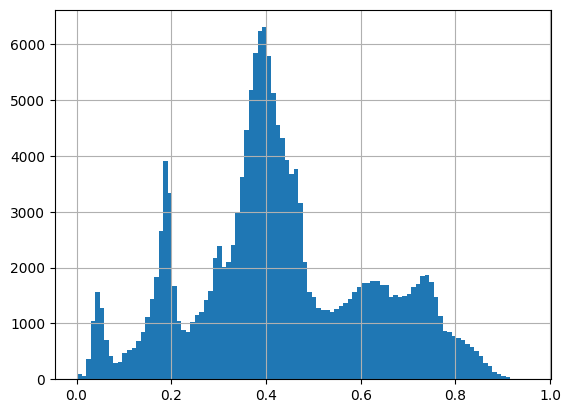

In [60]:
adata.obs['Dupl_rate'].hist(bins=100)